<a href="https://colab.research.google.com/github/gaston-nieto/diplo2024/blob/develop/Supervisado_competencia/competencia_kaggle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report,ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
import pandas as pd
import numpy as np

#**Análisis Exploratorio**

---



Cargamos el csv del dataset de train

In [2]:
_path_train = "https://raw.githubusercontent.com/mfsalamone/Diplomatura_Cs_Datos/main/diabetes_prediction_dataset_train-labeled.csv"
train_df = pd.read_csv(_path_train)
print(train_df.shape)
print(train_df.describe())

(95000, 10)
             patient           age  hypertension  heart_disease           bmi  \
count   95000.000000  95000.000000  95000.000000   95000.000000  95000.000000   
mean    50016.501389     41.935269      0.075074       0.039463     27.320879   
std     28868.357071     22.514788      0.263512       0.194695      6.626335   
min         1.000000      0.080000      0.000000       0.000000     10.010000   
25%     25021.750000     24.000000      0.000000       0.000000     23.650000   
50%     50024.000000     43.000000      0.000000       0.000000     27.320000   
75%     75024.250000     60.000000      0.000000       0.000000     29.580000   
max    100000.000000     80.000000      1.000000       1.000000     95.690000   

        HbA1c_level  blood_glucose_level      diabetes  
count  95000.000000         95000.000000  95000.000000  
mean       5.527659           138.070537      0.085074  
std        1.070261            40.739962      0.278993  
min        3.500000           

imprimimos las primeras lineas para ver las columnas y algunos datos

In [3]:
train_df.head()

,patient,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,20432,Male,4.0,0,0,never,19.28,3.5,155,0
1,49682,Female,50.0,0,0,former,27.32,5.7,159,0
2,73886,Female,43.0,0,0,never,21.54,4.5,145,0
3,53144,Male,64.0,0,0,current,28.22,6.0,130,0
4,98507,Male,10.0,0,0,No Info,15.46,6.1,140,0


# Analisis de las columnas

*   **Patient**: ID del Paciente analizado.
*   **Gender**: El género se refiere al sexo biológico del individuo, lo cual puede tener un impacto en su susceptibilidad a la diabetes. Hay tres categorías: masculino, femenino y otro.
*   **Age**: La edad es un factor importante ya que la diabetes se diagnostica con más frecuencia en adultos mayores. La edad en nuestro conjunto de datos varía de 0 a 80 años.
*   **Hypertension**: La hipertensión es una condición médica en la que la presión arterial en las arterias se mantiene persistentemente elevada. Tiene valores de 0 o 1, donde 0 indica que no tienen hipertensión y 1 significa que tienen hipertensión.
*   **Heart Disease**: La enfermedad cardíaca es otra condición médica asociada con un mayor riesgo de desarrollar diabetes. Tiene valores de 0 o 1, donde 0 indica que no tienen enfermedad cardíaca y 1 significa que tienen enfermedad cardíaca.
*   **Smoking History**: El historial de tabaquismo también se considera un factor de riesgo para la diabetes y puede exacerbar las complicaciones asociadas con la diabetes. En nuestro conjunto de datos, tenemos 5 categorías: no actual, exfumador, sin información, actual, nunca, y alguna vez.
*   **BMI**: El IMC (Índice de Masa Corporal) es una medida de la grasa corporal basada en el peso y la altura. Los valores más altos de IMC están vinculados a un mayor riesgo de diabetes. El rango de IMC en el conjunto de datos es de 10.16 a 71.55. Un IMC menor de 18.5 es bajo peso, de 18.5 a 24.9 es normal, de 25 a 29.9 es sobrepeso y 30 o más es obesidad.
*   **HbA1c Level:** El nivel de HbA1c (Hemoglobina A1c) es una medida del nivel promedio de azúcar en la sangre de una persona durante los últimos 2-3 meses. Los niveles más altos indican un mayor riesgo de desarrollar diabetes. Generalmente, un nivel de HbA1c superior al 6.5% indica diabetes.
*   **Blood Glucose Level**: El nivel de glucosa en sangre se refiere a la cantidad de glucosa en el torrente sanguíneo en un momento dado. Los niveles altos de glucosa en sangre son un indicador clave de diabetes.
*   **Diabetes**: La diabetes es la variable objetivo que se está prediciendo, con valores de 1 que indican la presencia de diabetes y 0 que indican la ausencia de diabetes.


In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95000 entries, 0 to 94999
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   patient              95000 non-null  int64  
 1   gender               95000 non-null  object 
 2   age                  95000 non-null  float64
 3   hypertension         95000 non-null  int64  
 4   heart_disease        95000 non-null  int64  
 5   smoking_history      95000 non-null  object 
 6   bmi                  95000 non-null  float64
 7   HbA1c_level          95000 non-null  float64
 8   blood_glucose_level  95000 non-null  int64  
 9   diabetes             95000 non-null  int64  
dtypes: float64(3), int64(5), object(2)
memory usage: 7.2+ MB


Analisis de Datos Faltantes

<Axes: >

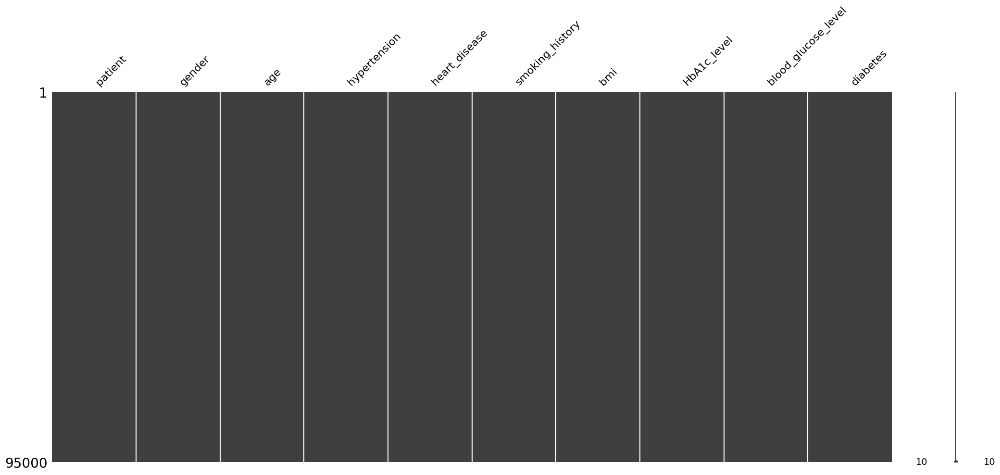

In [5]:
import missingno as msno
msno.matrix(train_df.copy())

No hay Registros Nulos en el Dataset

Histogramas de Frecuencias las variables contenidas en cols_graf


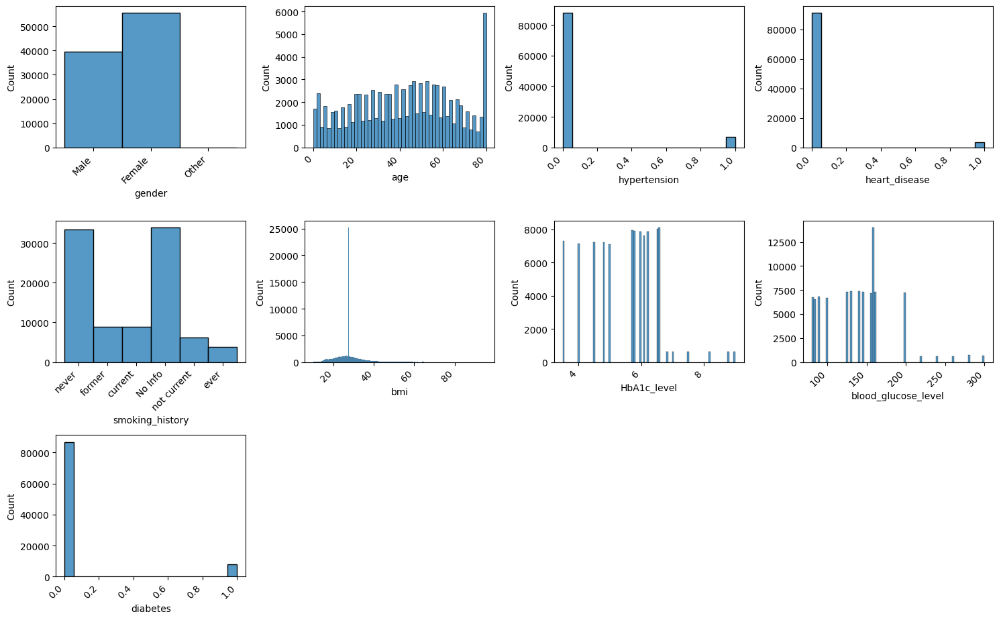

In [6]:
cols_graf=['gender', 'age', 'hypertension', 'heart_disease','smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level','diabetes']

import seaborn as sns

plt.figure(figsize=(15, 12), dpi=100)

for i, columna in enumerate(cols_graf, start=1):
    plt.subplot(4, 4, i)
    sns.histplot(data=train_df, x=columna)
    plt.tight_layout()
    plt.xticks(rotation=45, ha='right')

**Observaciones**


*   Existen 3 géneros en el dataset, existen más de 10.000 mujeres que hombres y muy pocos categorizados como otros.
*   Vemos que hay gran concentración de datos en la edad, cercana a los 80 años
*   En el dataset existen desbalanceos entre personas con hipertensión, problemas de corazon y diabetes.

Analisis en detalle para 'age', 'bmi', 'HbA1c_level', 'blood_glucose_level'

In [7]:
cols_graf_new = ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']

import plotly.express as px
from plotly.subplots import make_subplots

fig = make_subplots(rows=len(cols_graf_new), cols=1, subplot_titles=[f'{col} vs diabetes' for col in cols_graf_new])

for i, column in enumerate(cols_graf_new):
    df_grouped = train_df.groupby([column, 'diabetes']).size().reset_index(name='counts')
    scatter = px.scatter(df_grouped, x=column, y='diabetes', size='counts', title=f'{column} vs diabetes')
    for trace in scatter.data:
        fig.add_trace(trace, row=i+1, col=1)

# # Actualizar el layout de la figura
fig.update_layout(height=1000, width=1200, showlegend=False)
fig.update_yaxes(tickvals=[0, 1], title='diabetes')

fig.show()

**Observaciones**

*HbA1c_level*: Observamos que las personas con diabetes, poseen más de 5.7 de hemoglobina glucosilada (HbA1c) que refleja los niveles de glucosa en sangre.

*Blood_glucose_level*: Al igual que HbA1c_level, es importante los niveles de glucosa en sangre para el diagnóstico de la diabetes, observamos que las personas con diabetenes poseen más de 126.

Comparacion de BoxPlot segun la variable diabetes

In [8]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

cols_graf_vio = ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']

con_diabetes = train_df[train_df['diabetes'] == 1]
sin_diabetes = train_df[train_df['diabetes'] == 0]

fig = make_subplots(rows=len(cols_graf_vio), cols=1, subplot_titles=[f'{col}' for col in cols_graf_vio])

for i, column in enumerate(cols_graf_vio):
    box_con_diabetes = go.Box(x=con_diabetes[column], name=f'{column} (Con Diabetes)', marker_color='blue')
    box_sin_diabetes = go.Box(x=sin_diabetes[column], name=f'{column} (Sin Diabetes)', marker_color='red')
    fig.add_trace(box_con_diabetes, row=i+1, col=1)
    fig.add_trace(box_sin_diabetes, row=i+1, col=1)

fig.update_layout(height=200 * len(cols_graf_vio), width=800, title_text="Box Plots Con y Sin Diabetes")

fig.show()

**Observaciones**

A simple vista, no se observan tantos valores atípicos o dispersionaes de los datos de las variables analizadas. La variable índice de masa corporal (bmi) es la que mayor variabilidad se observa de los valores.

Analizamos el Balanceo de Datos

In [9]:
df_bal=train_df.copy()

attendance_counts = df_bal['diabetes'].value_counts().reset_index()
attendance_counts.columns = ['diabetes', 'count']

fig = px.bar(attendance_counts, x='diabetes', y='count', text='count', title='Distribucion Variable Diabetes')
fig.update_traces(textposition='auto')

fig.show()

Analisis de variable Diabetes

In [10]:
total_count = attendance_counts['count'].sum()
attendance_counts['Porcentaje'] = (attendance_counts['count'] / total_count) * 100
attendance_counts['Porcentaje'] = attendance_counts['Porcentaje'].apply(lambda x: f"{x:.2f}%")
attendance_counts

,diabetes,count,Porcentaje
0,0,86918,91.49%
1,1,8082,8.51%


**Observaciones**

A simple vista observamos un gran desbalanceo entre las clases de diabetes/no diabetes. Casi el 92% de la base de datos corresponde a personas sin diabetes y solamente un 8% con diabetes

Analisis para el historial de Tabaquismo

In [11]:
smoke_diabetes_counts = train_df.copy().groupby(['smoking_history', 'diabetes']).size().unstack(fill_value=0)
smoke_totals = smoke_diabetes_counts.sum(axis=1).sort_values()
smoke_diabetes_counts = smoke_diabetes_counts.loc[smoke_totals.index]
smoke_totals = smoke_diabetes_counts.sum(axis=1)
percentages = smoke_diabetes_counts.div(smoke_totals, axis=0) * 100
percentages = percentages.map(lambda x: f'{x:.2f}%')
percentages

diabetes,0,1
smoking_history,,
ever,88.32%,11.68%
not current,89.38%,10.62%
current,89.81%,10.19%
former,82.91%,17.09%
never,90.48%,9.52%
No Info,95.92%,4.08%


Analisis Grafico del Historial de Tabaquismo

In [12]:
fig = px.bar(smoke_diabetes_counts.reset_index(), x='smoking_history', y=[0, 1], title='Distribución de Diabetes por Historial de Tabaquismo', labels={'value': 'Número de Pacientes', 'smoking_history': 'Historial de Tabaquismo', 'variable': 'Diabetes'}, text_auto=True)
fig.update_layout( yaxis_title='Número de Pacientes', legend_title_text='Diabetes', barmode='stack')
fig.show()

**Observaciones**

Para los casos pacientes que han fumado\, también se observa el desbalanceo de las clases y se observa un gran número de personas "No Info"

# **Preprocesamiento**

---



Separaremos el dataset en train y test.

In [13]:
imputer_cols = ["age", "hypertension", "heart_disease","bmi", "HbA1c_level", "blood_glucose_level"]
imputer = SimpleImputer(strategy="median")
train_df[imputer_cols] = imputer.fit_transform(train_df[imputer_cols])
y = train_df.diabetes
X = train_df.drop('diabetes',axis=1)
X

,patient,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,20432,Male,4.0,0.0,0.0,never,19.28,3.5,155.0
1,49682,Female,50.0,0.0,0.0,former,27.32,5.7,159.0
2,73886,Female,43.0,0.0,0.0,never,21.54,4.5,145.0
3,53144,Male,64.0,0.0,0.0,current,28.22,6.0,130.0
4,98507,Male,10.0,0.0,0.0,No Info,15.46,6.1,140.0
...,...,...,...,...,...,...,...,...,...
94995,81090,Female,56.0,0.0,0.0,never,22.30,6.2,158.0
94996,90924,Female,24.0,0.0,0.0,never,22.50,6.1,126.0
94997,64600,Female,32.0,0.0,0.0,never,24.92,6.6,145.0
94998,96132,Female,21.0,0.0,0.0,current,20.59,4.5,155.0


Vamos a separar la columna con los Id de los pacientes en una sola variable:

In [14]:
patientId = X.patient
X.drop('patient',axis=1,inplace=True)

Transformaremos las columnas gender y smoking_history,en variables numéricas con LabelEncoder, ya que los algoritmos entienden de 0 y 1

In [15]:
print(X.columns)
label_cols = ["gender", "smoking_history"]

for col in label_cols:
    X[col] = X[col].astype(str)
    X[col] = LabelEncoder().fit_transform(X[col])
X

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level'],
      dtype='object')


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,1,4.0,0.0,0.0,4,19.28,3.5,155.0
1,0,50.0,0.0,0.0,3,27.32,5.7,159.0
2,0,43.0,0.0,0.0,4,21.54,4.5,145.0
3,1,64.0,0.0,0.0,1,28.22,6.0,130.0
4,1,10.0,0.0,0.0,0,15.46,6.1,140.0
...,...,...,...,...,...,...,...,...
94995,0,56.0,0.0,0.0,4,22.30,6.2,158.0
94996,0,24.0,0.0,0.0,4,22.50,6.1,126.0
94997,0,32.0,0.0,0.0,4,24.92,6.6,145.0
94998,0,21.0,0.0,0.0,1,20.59,4.5,155.0


Escalaremos el dataset mediante StandarScaler que transforma los datos para que tengan una media de 0 y una desviación estándar de 1, ya que algunos algoritmos  basados en distancia, funcionan mejor cuando los datos están en una escala similar.

In [16]:
x_names = X.columns
X = StandardScaler().fit_transform(X)
X = pd.DataFrame(X, columns=x_names)
X

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,1.185739,-1.684913,-0.284899,-0.202693,0.961962,-1.213479,-1.894556,0.415552
1,-0.842187,0.358199,-0.284899,-0.202693,0.432680,-0.000133,0.161028,0.513736
2,-0.842187,0.047291,-0.284899,-0.202693,0.961962,-0.872414,-0.960200,0.170091
3,1.185739,0.980016,-0.284899,-0.202693,-0.625885,0.135690,0.441335,-0.198100
4,1.185739,-1.418420,-0.284899,-0.202693,-1.155167,-1.789970,0.534771,0.047361
...,...,...,...,...,...,...,...,...
94995,-0.842187,0.624692,-0.284899,-0.202693,0.961962,-0.757720,0.628206,0.489190
94996,-0.842187,-0.796604,-0.284899,-0.202693,0.961962,-0.727537,0.534771,-0.296284
94997,-0.842187,-0.441280,-0.284899,-0.202693,0.961962,-0.362326,1.001949,0.170091
94998,-0.842187,-0.929850,-0.284899,-0.202693,-0.625885,-1.015782,-0.960200,0.415552


A partir de los datos en las variables `X` e `y` separamos en train y en test:

In [17]:
x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state = 8)

# **CLASIFICADORES**

---



Primero probaremos con 3 clasificadores para tener una primera aproximación

Decision Tree
Accuracy train Decision Tree: 0.9992%
Accuracy test Decision Tree: 0.9506%
Gradient Boosting
Accuracy train Gradient Boosting: 0.9719%
Accuracy test Gradient Boosting: 0.9737%
Random Forest
Accuracy train Random Forest: 0.9992%
Accuracy test Random Forest: 0.9709%


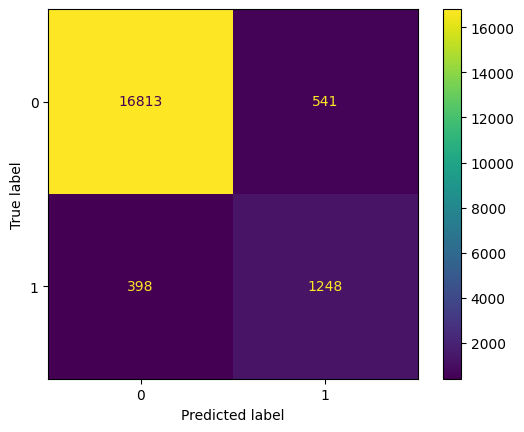

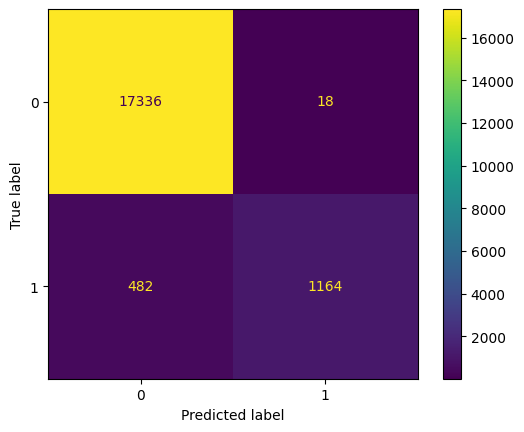

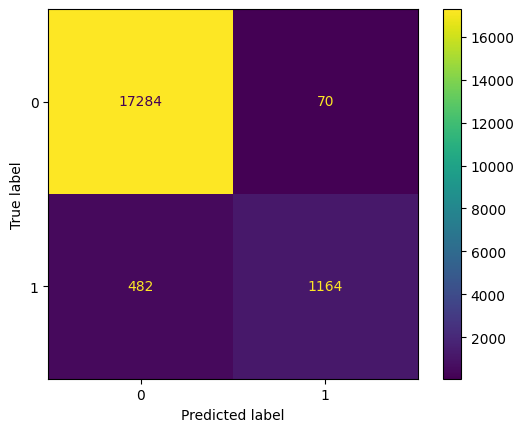

In [18]:
# from sklearn.metrics import accuracy_score

clfs = [
    DecisionTreeClassifier(),
    GradientBoostingClassifier(),
    RandomForestClassifier()
]

names = ['Decision Tree', 'Gradient Boosting', 'Random Forest']

trained_models = []
accuracy_models = []

for clf, name in zip(clfs, names):
    print(name)
    clf.fit(x_train, y_train)

    # Evaluate on training data
    train_predictions = clf.predict(x_train)
    train_accuracy = accuracy_score(y_train, train_predictions)
    print(f"Accuracy train {name}: {train_accuracy:.4f}%")

    # Evaluate on test data
    test_predictions = clf.predict(x_test)
    test_accuracy = accuracy_score(y_test, test_predictions)
    print(f"Accuracy test {name}: {test_accuracy:.4f}%")

    ConfusionMatrixDisplay.from_predictions(y_test, test_predictions)

    trained_models.append(clf)
    accuracy_models.append(test_accuracy * 100)


De los 3 clasificadores, observamos que el grandient boosting, es el que mejor generaliza. A continuación, buscaremos los mejores hiperparámetros mediante Grid Search. Aclaracion: El codigo esta comentado, dado que tarda bastante su ejecucion, los parametros se guardaron en una variable en el siguiente bloque de codigo)

In [19]:
#param_grid = {
#     'learning_rate': [0.01, 0.05],
#     'n_estimators': [200, 300],
#     'max_depth': [4, 5],
#     'min_samples_split': [2, 5],
#     'min_samples_leaf': [1, 2, 3],
#     'subsample': [0.8, 0.9],
#     'max_features': ['log2'],
#     'loss': ['exponential'],
#     'criterion': ['friedman_mse']
#}

#grid = GridSearchCV(GradientBoostingClassifier(random_state=8), param_grid, cv=5, n_jobs=-1)

#grid.fit(x_train, y_train)

#print("Mejores parámetros:", grid.best_params_)


A partir de los resultados de Grid Search, volvemos a utilizar Gradient Boosting para ver si mejora el resultado

Accuracy train GradientBoostingClassifier: 97.2276%
Accuracy test GradientBoostingClassifier: 97.4053%


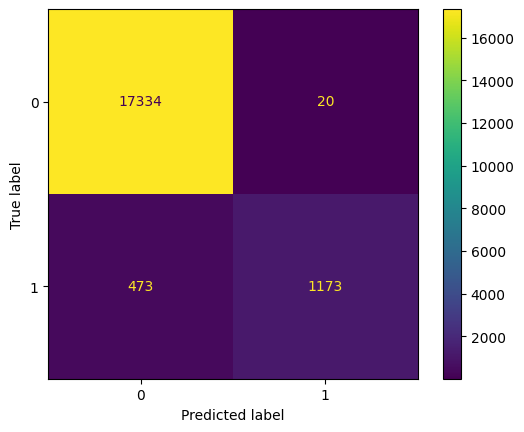

              precision    recall  f1-score   support

           0       0.97      1.00      0.99     17354
           1       0.98      0.71      0.83      1646

    accuracy                           0.97     19000
   macro avg       0.98      0.86      0.91     19000
weighted avg       0.97      0.97      0.97     19000



In [20]:
from sklearn.ensemble import GradientBoostingClassifier

param_grid = {'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'exponential', 'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 300, 'subsample': 0.9}
clf = GradientBoostingClassifier(**param_grid, random_state=8).fit(x_train, y_train)

train_predictions = clf.predict(x_train)
accuracy = accuracy_score(y_train, train_predictions)
print("Accuracy train GradientBoostingClassifier: %.4f%%" % (accuracy * 100.0))

test_predictions = clf.predict(x_test)
accuracy = accuracy_score(y_test, test_predictions)
print("Accuracy test GradientBoostingClassifier: %.4f%%" % (accuracy * 100.0))
ConfusionMatrixDisplay.from_predictions(y_test, test_predictions)
plt.show()

print(classification_report(y_test,clf.predict(x_test)))

Observamos que mejoró el clasificador al elegir Gradient Boosting con hiperparámetros. A continuación probaremos una red neuronal de clasificación binaria creado usando la biblioteca TensorFlow y Keras para ver si logramos mejores resultados.

# **RED NEURONAL**

---

In [40]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import Nadam

model = Sequential()
model.add(Dense(64, input_dim=X.shape[1], activation='elu'))
model.add(Dense(32, activation='elu'))
model.add(Dense(1, activation='sigmoid'))

optimizer = Nadam(learning_rate=0.005)

model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X, y, epochs=100, batch_size=128, validation_split=0.2, verbose=1)

Epoch 1/100


/Users/gastonnieto/Library/Python/3.9/lib/python/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



594/594 ━━━━━━━━━━━━━━━━━━━━ 1s 583us/step - accuracy: 0.9393 - loss: 0.1609 - val_accuracy: 0.9629 - val_loss: 0.1119
Epoch 2/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 469us/step - accuracy: 0.9662 - loss: 0.1033 - val_accuracy: 0.9663 - val_loss: 0.0992
Epoch 3/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step - accuracy: 0.9708 - loss: 0.0874 - val_accuracy: 0.9673 - val_loss: 0.0940
Epoch 4/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step - accuracy: 0.9714 - loss: 0.0834 - val_accuracy: 0.9698 - val_loss: 0.0893
Epoch 5/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - accuracy: 0.9713 - loss: 0.0835 - val_accuracy: 0.9684 - val_loss: 0.0903
Epoch 6/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step - accuracy: 0.9718 - loss: 0.0820 - val_accuracy: 0.9706 - val_loss: 0.0883
Epoch 7/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - accuracy: 0.9711 - loss: 0.0834 - val_accuracy: 0.9696 - val_loss: 0.0900
Epoch 8/100
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 448us/step - accuracy: 0.9719 - loss: 0.0820 - val_

In [41]:
loss, accuracy = model.evaluate(x_test, y_test, verbose=0)
print(f"Precisión del modelo en el conjunto de prueba: {accuracy:.4f}")

y_pred = model.predict(x_test)
y_pred_classes = (y_pred > 0.5).astype(int)

accuracy_score_result = accuracy_score(y_test, y_pred_classes)
print(f"Precisión de las predicciones: {accuracy_score_result:.4f}")

Precisión del modelo en el conjunto de prueba: 0.9741
594/594 ━━━━━━━━━━━━━━━━━━━━ 0s 255us/step
Precisión de las predicciones: 0.9741


A partir de los resultados, observamos que el modelo mejora con una red neuronal aunque no de manera significativa.
Podemos observar un accuracy de 0.9741 vs 0.974053 que obteníamos con Gradient Boosting

# **TEST**

---

Cargamos el csv de test

In [23]:
_path_test = "https://raw.githubusercontent.com/mfsalamone/Diplomatura_Cs_Datos/main/diabetes_prediction_dataset_test.csv"
test_df = pd.read_csv(_path_test)
print(test_df.shape)
print(test_df.describe())

(5000, 10)
            patient          age  hypertension  heart_disease          bmi  \
count   5000.000000  5000.000000   5000.000000    5000.000000  5000.000000   
mean   49696.473600    40.947016      0.070600       0.038600    27.318644   
std    28855.568156    22.537466      0.256181       0.192659     6.832943   
min        7.000000     0.160000      0.000000       0.000000    10.620000   
25%    24720.750000    23.000000      0.000000       0.000000    23.410000   
50%    49522.500000    41.000000      0.000000       0.000000    27.320000   
75%    74686.000000    59.000000      0.000000       0.000000    29.632500   
max    99970.000000    80.000000      1.000000       1.000000    88.760000   

       HbA1c_level  blood_glucose_level  diabetes  
count  5000.000000          5000.000000       0.0  
mean      5.524620           137.821000       NaN  
std       1.078559            40.101933       NaN  
min       3.500000            80.000000       NaN  
25%       4.800000        

Vemos un poco su contenido

In [24]:
test_df.head()

,patient,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,49267,Male,53.0,0,0,never,31.99,4.5,126,NaN
1,82280,Female,22.0,0,0,never,25.96,6.6,130,NaN
2,33216,Female,37.0,0,0,never,22.24,6.2,126,NaN
3,94551,Female,29.0,0,0,not current,31.01,5.0,80,NaN
4,43760,Male,30.0,0,0,ever,28.66,6.6,100,NaN


Un poco de info del mismo para ver con que nos encontramos

In [25]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   patient              5000 non-null   int64  
 1   gender               5000 non-null   object 
 2   age                  5000 non-null   float64
 3   hypertension         5000 non-null   int64  
 4   heart_disease        5000 non-null   int64  
 5   smoking_history      5000 non-null   object 
 6   bmi                  5000 non-null   float64
 7   HbA1c_level          5000 non-null   float64
 8   blood_glucose_level  5000 non-null   int64  
 9   diabetes             0 non-null      float64
dtypes: float64(4), int64(4), object(2)
memory usage: 390.8+ KB


Para poder evaluar nuestra predicción los datos de prueba deben tener exactamente el mismo tratamiento que los datos de entrenamiento

In [26]:
Y_test = test_df.diabetes
PatientId_test = test_df['patient']
X_test = test_df.drop(['patient','diabetes'],axis=1,inplace=True)



In [27]:
X_test = test_df

Realizamos el mismo procedimiento que en el dataset de train

In [28]:
imputer_cols = ["age", "hypertension", "heart_disease","bmi", "HbA1c_level", "blood_glucose_level"]
imputer = SimpleImputer(strategy="median")
X_test[imputer_cols] = imputer.fit_transform(X_test[imputer_cols])

In [29]:
label_cols = ["gender", "smoking_history" ]

for col in label_cols:
    X_test[col] = X_test[col].astype(str)
    X_test[col] = LabelEncoder().fit_transform(X_test[col])
X_test

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,1,53.0,0.0,0.0,4,31.99,4.5,126.0
1,0,22.0,0.0,0.0,4,25.96,6.6,130.0
2,0,37.0,0.0,0.0,4,22.24,6.2,126.0
3,0,29.0,0.0,0.0,5,31.01,5.0,80.0
4,1,30.0,0.0,0.0,2,28.66,6.6,100.0
...,...,...,...,...,...,...,...,...
4995,0,23.0,0.0,0.0,4,22.77,6.6,200.0
4996,0,51.0,0.0,0.0,0,27.32,4.0,155.0
4997,1,79.0,0.0,0.0,0,23.80,6.0,126.0
4998,1,24.0,0.0,0.0,4,22.68,6.1,85.0


In [30]:
cols = X_test.columns
X_test = StandardScaler().fit_transform(X_test)
X_test = pd.DataFrame(X_test, columns=cols)

In [31]:
X_test

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,1.216115,0.534851,-0.275614,-0.200374,0.989602,0.683720,-0.950085,-0.294803
1,-0.819565,-0.840774,-0.275614,-0.200374,0.989602,-0.198857,0.997153,-0.195048
2,-0.819565,-0.175149,-0.275614,-0.200374,0.989602,-0.743333,0.626250,-0.294803
3,-0.819565,-0.530149,-0.275614,-0.200374,1.517446,0.540283,-0.486457,-1.441995
4,1.216115,-0.485774,-0.275614,-0.200374,-0.066086,0.196327,0.997153,-0.943216
...,...,...,...,...,...,...,...,...
4995,-0.819565,-0.796399,-0.275614,-0.200374,0.989602,-0.665760,0.997153,1.550679
4996,-0.819565,0.446101,-0.275614,-0.200374,-1.121774,0.000198,-1.413713,0.428426
4997,1.216115,1.688601,-0.275614,-0.200374,-1.121774,-0.515004,0.440799,-0.294803
4998,1.216115,-0.752024,-0.275614,-0.200374,0.989602,-0.678933,0.533525,-1.317300


Generamos el archivo para el Gradient Boosting Classifier

In [32]:
test_id = PatientId_test
test_pred = np.int64(clf.predict(X_test))

Con el resultado predicho tenemos que generar el archivo `.csv` para subir a la competencia de kaggle:

In [33]:
submission = pd.DataFrame(list(zip(test_id, test_pred)), columns=["patient", "diabetes"])
submission.to_csv("GradientBoostingClassifier.csv", header=True, index=False)

Generamos el archivo para la Red Neuronal

In [34]:
test_id = PatientId_test
test_pred = np.int64(model.predict(X_test))

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 246us/step


In [35]:
submission = pd.DataFrame(list(zip(test_id, test_pred)), columns=["patient", "diabetes"])
submission.to_csv("keras.csv", header=True, index=False)